## visualize data

In [113]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [114]:
%matplotlib inline

In [115]:
FEATURES = ("grid_cc", "grid_exg", "grid_ch", "grid_cv")

### load data

In [116]:
# 2020
data_2020 = dict.fromkeys(FEATURES)
## load features
data_2020["grid_cc"] = pd.read_pickle("../data/2020/grid_cc.pkl")
data_2020["grid_exg"] = pd.read_pickle("../data/2020/grid_exg.pkl")
data_2020["grid_ch"] = pd.read_pickle("../data/2020/grid_ch.pkl")
data_2020["grid_cv"] = pd.read_pickle("../data/2020/grid_cv.pkl")

yield_data_2020 = pd.read_pickle("../data/2020/yield_2020.pkl")

In [117]:
# 2021
data_2021 = dict.fromkeys(FEATURES)
## load features
data_2021["grid_cc"] = pd.read_pickle("../data/2021/grid_cc.pkl")
data_2021["grid_exg"] = pd.read_pickle("../data/2021/grid_exg.pkl")
data_2021["grid_ch"] = pd.read_pickle("../data/2021/grid_ch.pkl")
data_2021["grid_cv"] = pd.read_pickle("../data/2021/grid_cv.pkl")

yield_data_2021 = pd.read_pickle("../data/2021/yield_2021.pkl")

In [118]:
# 2022
data_2022 = dict.fromkeys(FEATURES)
## load features
data_2022["grid_cc"] = pd.read_pickle("../data/2022/grid_cc.pkl")
data_2022["grid_exg"] = pd.read_pickle("../data/2022/grid_exg.pkl")
data_2022["grid_ch"] = pd.read_pickle("../data/2022/grid_ch.pkl")
data_2022["grid_cv"] = pd.read_pickle("../data/2022/grid_cv.pkl")

yield_data_2022 = pd.read_pickle("../data/2022/yield_2022.pkl")

### display shape information

In [119]:
def display_shape_information(data, yield_data):
    for feature in FEATURES:
        print(f"{feature}, shape: {data[feature].shape}", end=" ")
    print(f"yield data shape: {yield_data.shape}")

In [120]:
# 2020
display_shape_information(data_2020, yield_data_2020)

grid_cc, shape: (3523, 17) grid_exg, shape: (3523, 19) grid_ch, shape: (3523, 17) grid_cv, shape: (3523, 17) yield data shape: (3523, 2)


In [121]:
# 2021
display_shape_information(data_2021, yield_data_2021)

grid_cc, shape: (3718, 17) grid_exg, shape: (3718, 17) grid_ch, shape: (3718, 16) grid_cv, shape: (3718, 16) yield data shape: (3718, 2)


In [122]:
# 2022
display_shape_information(data_2022, yield_data_2022)

grid_cc, shape: (3983, 14) grid_exg, shape: (3983, 16) grid_ch, shape: (3983, 14) grid_cv, shape: (3983, 14) yield data shape: (3983, 2)


### visualize

In [123]:
# value range
def value_range(datasets, feature):
    maxi = np.max([np.max(data[feature].values[:, 1:]) for data in datasets])
    mini = np.min([np.min(data[feature].values[:, 1:]) for data in datasets])
    return [mini, maxi]

In [124]:
datasets = [data_2020, data_2021, data_2022]

In [125]:
value_range_grid_cc = value_range(datasets, "grid_cc")
value_range_grid_exg = value_range(datasets, "grid_exg")
value_range_grid_ch = value_range(datasets, "grid_ch")
value_range_grid_cv = value_range(datasets, "grid_cv")

In [126]:
graph_info = [
    ["grid_cc", "canopy cover", value_range_grid_cc],
    ["grid_exg", "excess greenness index", value_range_grid_exg],
    ["grid_ch", "canopy height", value_range_grid_ch],
    ["grid_cv", "canopy volume", value_range_grid_cv],
]

In [127]:
labels_2020 = [column[-4:] for column in data_2020["grid_cc"].columns[1:]]
labels_2021 = [column[-4:] for column in data_2021["grid_cc"].columns[1:]]
labels_2022 = [column[-4:] for column in data_2022["grid_cc"].columns[1:]]

In [128]:
labels_exg_2020 = [column[-4:] for column in data_2020["grid_exg"].columns[1:]]
labels_exg_2021 = [column[-4:] for column in data_2021["grid_exg"].columns[1:]]
labels_exg_2022 = [column[-4:] for column in data_2022["grid_exg"].columns[1:]]

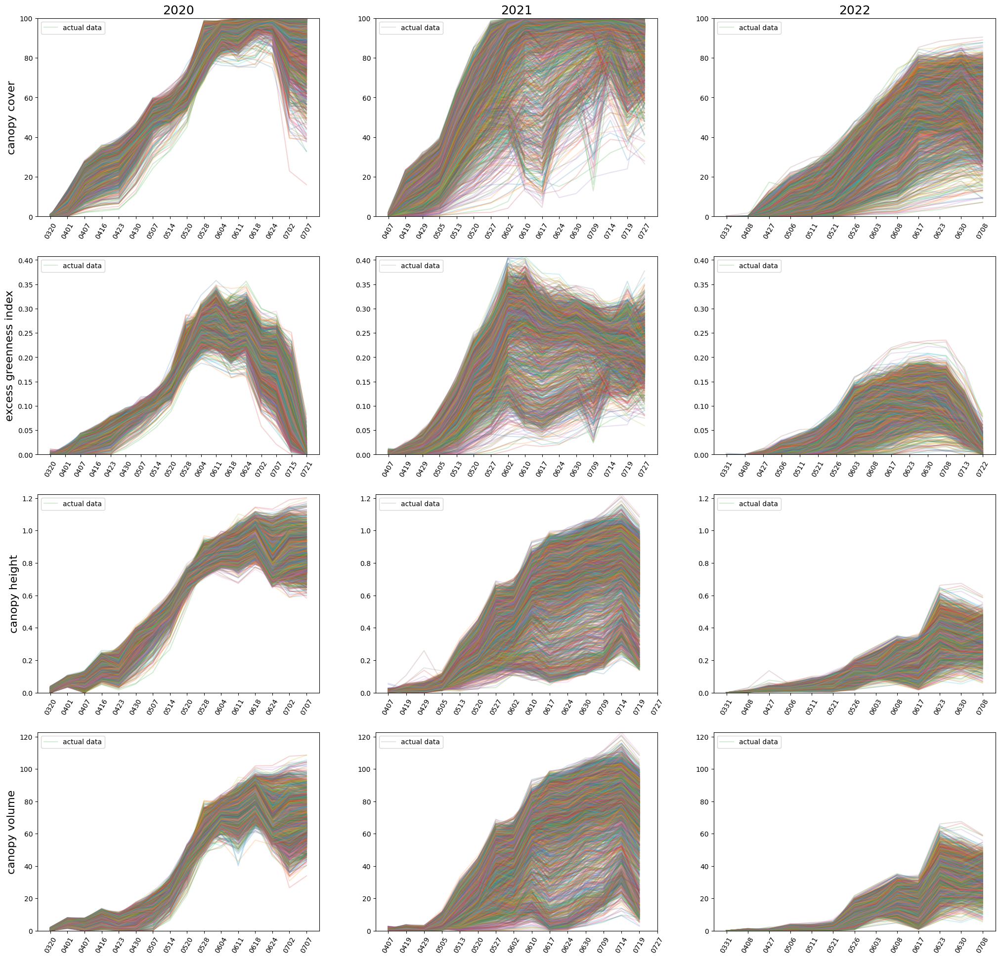

In [129]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(25, 24))

# generate graph
for i, info in enumerate(graph_info):
    # create labels
    if info[0] == "grid_exg":
        labels_20 = labels_exg_2020
        labels_21 = labels_exg_2021
        labels_22 = labels_exg_2022
    else:
        labels_20 = labels_2020
        labels_21 = labels_2021
        labels_22 = labels_2022

    # 2020
    handles_2020 = axes[i][0].plot(data_2020[info[0]].values[:, 1:].T, alpha=0.2)
    axes[i][0].set_ylabel(info[1], fontsize=16)
    axes[i][0].set_ylim(info[2])
    axes[i][0].set_xticks(list(range(len(labels_20))), labels_20, rotation=60)
    axes[i][0].legend(handles_2020[-1:], ["actual data"], loc="upper left")

    # 2021
    handles_2021 = axes[i][1].plot(data_2021[info[0]].values[:, 1:].T, alpha=0.2)
    axes[i][1].set_ylim(info[2])
    axes[i][1].set_xticks(list(range(len(labels_21))), labels_21, rotation=60)
    axes[i][1].legend(handles_2021[-1:], ["actual data"], loc="upper left")

    # 2022
    handles_2022 = axes[i][2].plot(data_2022[info[0]].values[:, 1:].T, alpha=0.2)
    axes[i][2].set_ylim(info[2])
    axes[i][2].set_xticks(list(range(len(labels_22))), labels_22, rotation=60)
    axes[i][2].legend(handles_2022[-1:], ["actual data"], loc="upper left")

axes[0][0].set_title("2020", fontsize=18)
axes[0][1].set_title("2021", fontsize=18)
axes[0][2].set_title("2022", fontsize=18);

### EDA

- **canopy cover, height, volume** should always increases, don't decrease like a sigmoid function
- **excess greenness index** may be like a bell curve

#### generare difference between date

In [130]:
def generate_difference_data(data):
    """generate the difference between dates"""
    difference_data = dict.fromkeys(FEATURES)

    for feature in FEATURES:
        difference_data[feature] = np.diff(data[feature].values[:, 1:])
    return difference_data

In [131]:
difference_data_2020 = generate_difference_data(data_2020)
difference_data_2021 = generate_difference_data(data_2021)
difference_data_2022 = generate_difference_data(data_2022)

#### visualize difference

In [132]:
difference_data_2020["grid_cc"].shape, data_2020["grid_cc"].shape

((3523, 15), (3523, 17))

In [133]:
data_2020["grid_cc"].columns[1:]

Index(['200320', '200401', '200407', '200416', '200423', '200430', '200507',
       '200514', '200520', '200528', '200604', '200611', '200618', '200624',
       '200702', '200707'],
      dtype='object')

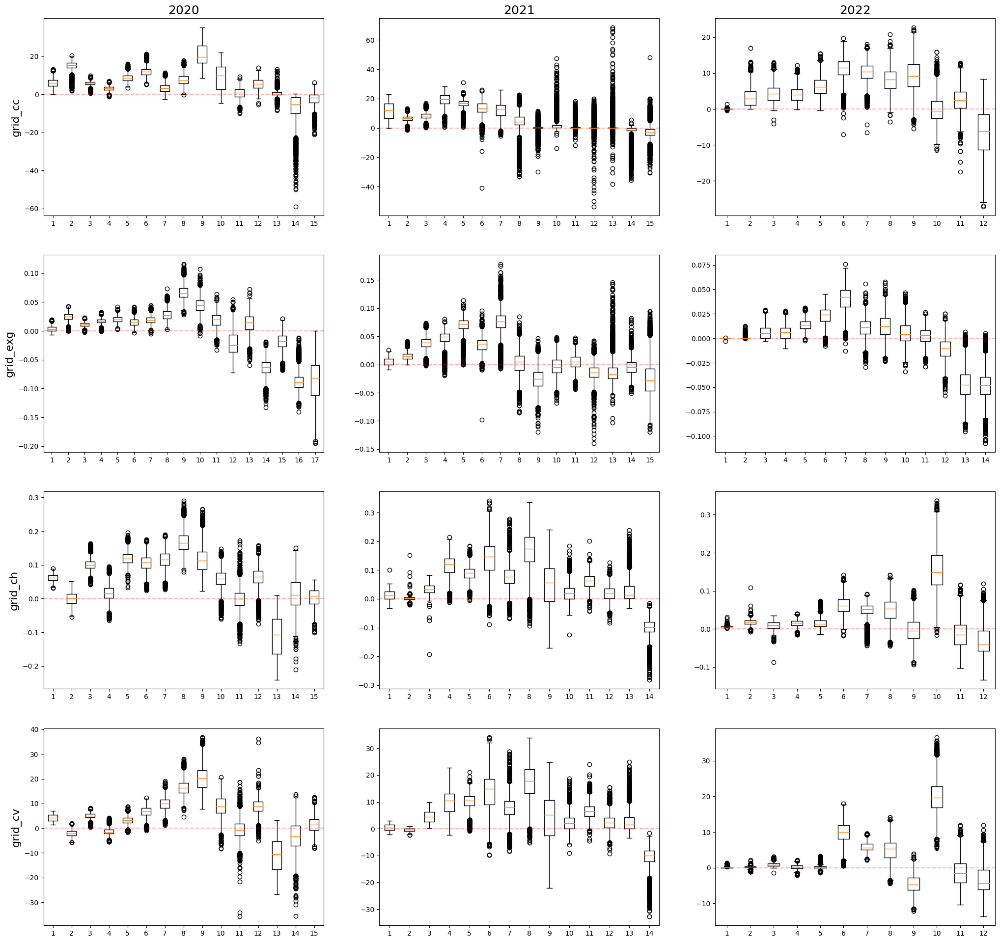

In [134]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(25, 24))

for i, feature in enumerate(FEATURES):
    # 2020
    axes[i][0].boxplot(difference_data_2020[feature])
    axes[i][0].axhline(y=0, linestyle='--', color='red', alpha=0.3)
    axes[i][0].set_ylabel(feature, fontsize=16)
    # 2021
    axes[i][1].boxplot(difference_data_2021[feature])
    axes[i][1].axhline(y=0, linestyle='--', color='red', alpha=0.3)
    # 2022
    axes[i][2].boxplot(difference_data_2022[feature])
    axes[i][2].axhline(y=0, linestyle='--', color='red', alpha=0.3)

axes[0][0].set_title("2020", fontsize=18);
axes[0][1].set_title("2021", fontsize=18);
axes[0][2].set_title("2022", fontsize=18);

#### drop problem columns

- **2020**:
    1. **canopy cover**: 0611 0702, 0707
    2. **excess greenness index**: 0624
    3. **canopy height**: 0604, 6011, 0618, 0624
    4. **canopy volume**: 0407, 0423, 0604, 0611, 0624, 0702
    
- **2021**:
    1. **canopy cover**: 0610, 0617, 0709, 0719
    2. **excess greenness index**: 0714, 0719, 0727
    3. **canopy height**: 0719
    4. **canopy volume**: 0602, 0617, 0624, 0719
    
- **2022**:
    1. **canopy cover**: 0708
    2. **excess greenness index**: none
    3. **canopy height**: 0603, 0617, 0630, 0708
    4. **canopy volume**: 0617, 0708

In [135]:
data_2020["grid_cc"].columns

Index(['FID', '200320', '200401', '200407', '200416', '200423', '200430',
       '200507', '200514', '200520', '200528', '200604', '200611', '200618',
       '200624', '200702', '200707'],
      dtype='object')

In [136]:
cleaned_data_2020 = dict.fromkeys(FEATURES)

cleaned_data_2020["grid_cc"] = data_2020["grid_cc"].drop(columns=["200611", "200702", "200707"])
cleaned_data_2020["grid_exg"] = data_2020["grid_exg"].drop(columns=["200624"])
cleaned_data_2020["grid_ch"] = data_2020["grid_ch"].drop(columns=["200604", "200611", "200618", "200624"])
cleaned_data_2020["grid_cv"] = data_2020["grid_cv"].drop(columns=["200407", "200423","200604", "200611", "200624", "200702"])

In [137]:
cleaned_data_2021 = dict.fromkeys(FEATURES)

cleaned_data_2021["grid_cc"] = data_2021["grid_cc"].drop(columns=["210610", "210617", "210709", "210719"])
cleaned_data_2021["grid_exg"] = data_2021["grid_exg"].drop(columns=["210714", "210719", "210727"])
cleaned_data_2021["grid_ch"] = data_2021["grid_ch"].drop(columns=["210719"])
cleaned_data_2021["grid_cv"] = data_2021["grid_cv"].drop(columns=["210602", "210617", "210624", "210719"])

In [138]:
cleaned_data_2022 = dict.fromkeys(FEATURES)

cleaned_data_2022["grid_cc"] = data_2022["grid_cc"].drop(columns=["220708"])
cleaned_data_2022["grid_exg"] = data_2022["grid_exg"].copy()
cleaned_data_2022["grid_ch"] = data_2022["grid_ch"].drop(columns=["220603", "220617", "220630", "220708"])
cleaned_data_2022["grid_cv"] = data_2022["grid_cv"].drop(columns=["220617", "220708"])

In [139]:
value_ranges = (value_range_grid_cc, value_range_grid_exg, value_range_grid_ch, value_range_grid_cv)

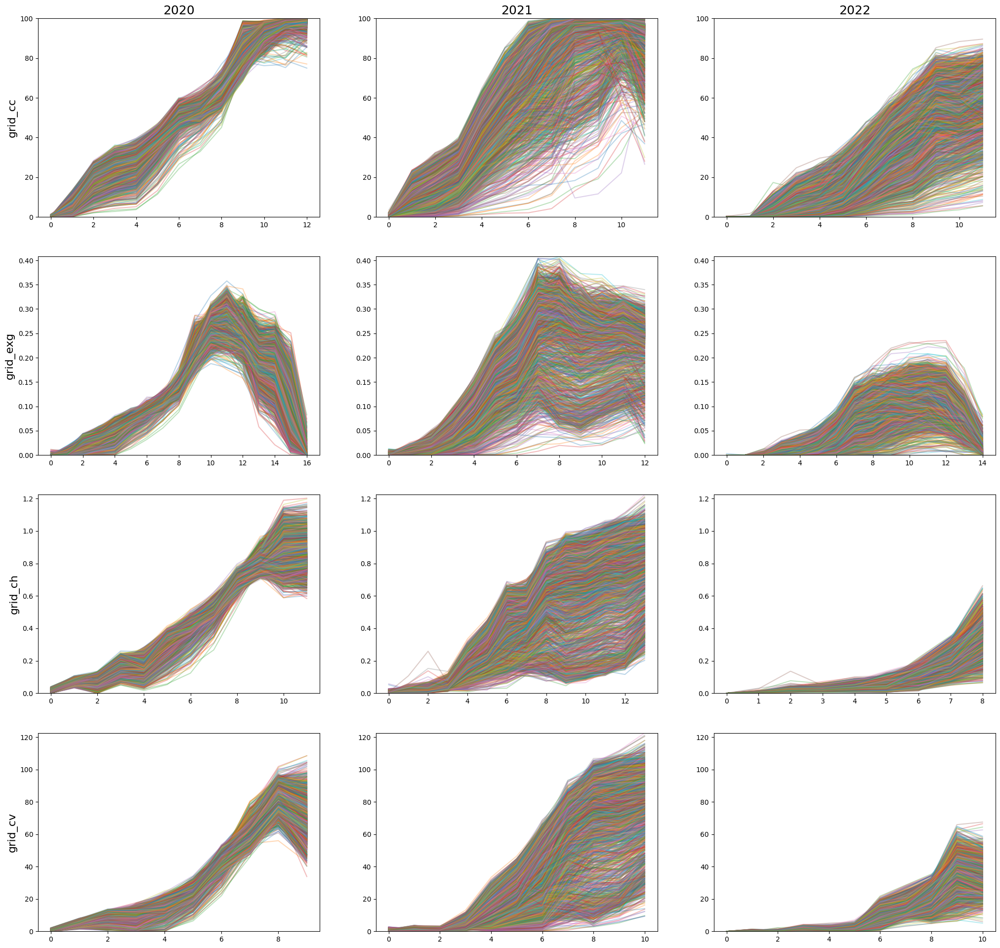

In [140]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(25, 24))

for i, feature in enumerate(FEATURES):
    axes[i][0].plot(cleaned_data_2020[feature].values[:,1:].T, alpha=0.3);
    axes[i][0].set_ylabel(feature, fontsize=16)
    axes[i][0].set_ylim(value_ranges[i])
    
    axes[i][1].plot(cleaned_data_2021[feature].values[:,1:].T, alpha=0.3);
    axes[i][1].set_ylim(value_ranges[i])
    
    axes[i][2].plot(cleaned_data_2022[feature].values[:,1:].T, alpha=0.3);
    axes[i][2].set_ylim(value_ranges[i])
    
axes[0][0].set_title("2020", fontsize=18);
axes[0][1].set_title("2021", fontsize=18);
axes[0][2].set_title("2022", fontsize=18);


### Data imputation (Spline)

| year     | seeding day  |  harvert day |
| ---------| ------------ | ------------ |
| 2020     | 2020-02-29   | 2020-08-03   |
| 2021     | 2021-02-27   | 2021-08-13   |
| 2022     | 2022-03-15   | 2022-08-04   |

#### convert date into index

In [141]:
from datetime import datetime

date_format = "%y%m%d"

In [142]:
growth_season_days_2020 = (
    datetime.strptime("200803", date_format) - datetime.strptime("200229", date_format)
).days
growth_season_days_2021 = (
    datetime.strptime("210813", date_format) - datetime.strptime("210227", date_format)
).days
growth_season_days_2022 = (
    datetime.strptime("220804", date_format) - datetime.strptime("220315", date_format)
).days

In [143]:
growth_season_days_2020, growth_season_days_2021, growth_season_days_2022

(156, 167, 142)

In [144]:
def date_index(data, planting_date, date_format):
    indices = []
    for column in data.columns[1:]:
        tmp = (datetime.strptime(column, date_format) - datetime.strptime(planting_date, date_format)).days
        indices.append(tmp)
    return indices

In [145]:
indices_2020 = dict.fromkeys(FEATURES)

for feature in FEATURES:
    indices_2020[feature] = date_index(cleaned_data_2020[feature], "200229", date_format)

In [146]:
len(indices_2020["grid_cc"]), len(indices_2020["grid_exg"]), len(indices_2020["grid_ch"]), len(indices_2020["grid_cv"])

(13, 17, 12, 10)

In [147]:
indices_2021 = dict.fromkeys(FEATURES)

for feature in FEATURES:
    indices_2021[feature] = date_index(cleaned_data_2021[feature], "210227", date_format)

In [148]:
len(indices_2021["grid_cc"]), len(indices_2021["grid_exg"]), len(indices_2021["grid_ch"]), len(indices_2021["grid_cv"])

(12, 13, 14, 11)

In [149]:
indices_2022 = dict.fromkeys(FEATURES)

for feature in FEATURES:
    indices_2022[feature] = date_index(cleaned_data_2022[feature], "220315", date_format)

In [150]:
len(indices_2022["grid_cc"]), len(indices_2022["grid_exg"]), len(indices_2022["grid_ch"]), len(indices_2022["grid_cv"])

(12, 15, 9, 11)

In [151]:
from sklearn.linear_model import Ridge
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import SplineTransformer

In [152]:
from sklearn.metrics import mean_squared_error

#### spline

In [153]:
def spline_ridge(x, y, growth_season_days, n_knots=2):
    """spline interpolation"""
    x = np.array(x)[:, np.newaxis]
    y = y.values[:, 1:].T
    assert x.shape[0] == y.shape[0]

    model = make_pipeline(
        SplineTransformer(n_knots=n_knots, degree=3), Ridge(alpha=1e-3),
    )
    model.fit(x, y)

    x_preds = np.linspace(0, growth_season_days - 1, growth_season_days).reshape(-1, 1)
    y_preds = model.predict(x_preds)
    return y_preds.T

#### 2020

In [154]:
imputed_data_2020 = dict.fromkeys(FEATURES)

##### canopy cover 2020

In [155]:
for i in range(2, 30):
    imputed_data_2020["grid_cc"] = spline_ridge(
        indices_2020["grid_cc"],
        cleaned_data_2020["grid_cc"],
        growth_season_days_2020,
        n_knots=i,
    )
    imputed_data_2020["grid_cc"][imputed_data_2020["grid_cc"] < 0] = 0
    imputed_data_2020["grid_cc"][imputed_data_2020["grid_cc"] > 0] = 100
    
    mse = mean_squared_error(
        cleaned_data_2020["grid_cc"].values[:, 1:],
        imputed_data_2020["grid_cc"][:, indices_2020["grid_cc"]],
    )
    print(f"num knots: {i:2d},  rmse: {np.sqrt(mse):.2f}")

num knots:  2,  rmse: 57.97
num knots:  3,  rmse: 53.83
num knots:  4,  rmse: 54.19
num knots:  5,  rmse: 56.02
num knots:  6,  rmse: 57.51
num knots:  7,  rmse: 53.88
num knots:  8,  rmse: 53.45
num knots:  9,  rmse: 56.51
num knots: 10,  rmse: 58.98
num knots: 11,  rmse: 59.06
num knots: 12,  rmse: 59.06
num knots: 13,  rmse: 59.06
num knots: 14,  rmse: 59.06
num knots: 15,  rmse: 59.06
num knots: 16,  rmse: 59.06
num knots: 17,  rmse: 59.06
num knots: 18,  rmse: 59.06
num knots: 19,  rmse: 59.06
num knots: 20,  rmse: 59.06
num knots: 21,  rmse: 59.06
num knots: 22,  rmse: 59.06
num knots: 23,  rmse: 59.06
num knots: 24,  rmse: 59.06
num knots: 25,  rmse: 59.06
num knots: 26,  rmse: 59.06
num knots: 27,  rmse: 59.06
num knots: 28,  rmse: 59.06
num knots: 29,  rmse: 59.06


In [156]:
imputed_data_2020["grid_cc"] = spline_ridge(
    indices_2020["grid_cc"],
    cleaned_data_2020["grid_cc"],
    growth_season_days_2020,
    n_knots=3,
)

imputed_data_2020["grid_cc"][imputed_data_2020["grid_cc"] < 0] = 0
imputed_data_2020["grid_cc"][imputed_data_2020["grid_cc"] > 100] = 100

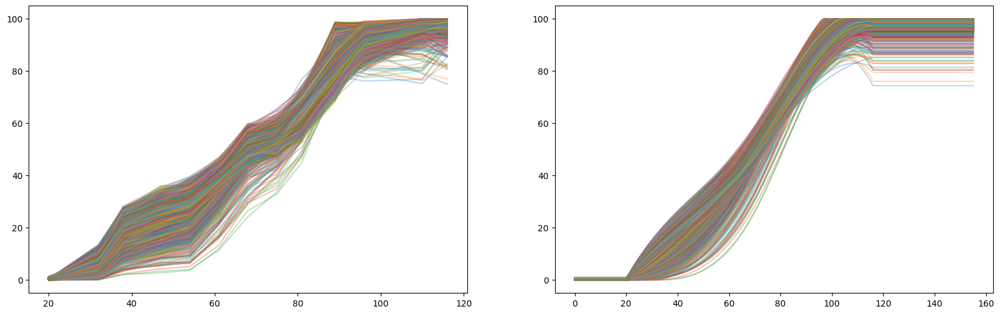

In [157]:
fig, axes = plt.subplots(ncols=2, figsize=(20, 6))

axes[0].plot(indices_2020["grid_cc"], cleaned_data_2020["grid_cc"].values[:,1:].T, alpha=0.3);
axes[1].plot(imputed_data_2020["grid_cc"].T, alpha=0.3);


##### excess greeness index 2020

In [158]:
for i in range(2, 30):
    imputed_data_2020["grid_exg"] = spline_ridge(
        indices_2020["grid_exg"],
        cleaned_data_2020["grid_exg"],
        growth_season_days_2020,
        n_knots=i,
    )
    imputed_data_2020["grid_exg"][imputed_data_2020["grid_exg"] < 0] = 0
    
    mse = mean_squared_error(
        cleaned_data_2020["grid_exg"].values[:, 1:],
        imputed_data_2020["grid_exg"][:, indices_2020["grid_exg"]],
    )
    print(f"num knots: {i:2d},  rmse: {np.sqrt(mse):.2f}")

num knots:  2,  rmse: 0.03
num knots:  3,  rmse: 0.02
num knots:  4,  rmse: 0.01
num knots:  5,  rmse: 0.01
num knots:  6,  rmse: 0.01
num knots:  7,  rmse: 0.01
num knots:  8,  rmse: 0.01
num knots:  9,  rmse: 0.01
num knots: 10,  rmse: 0.00
num knots: 11,  rmse: 0.00
num knots: 12,  rmse: 0.00
num knots: 13,  rmse: 0.00
num knots: 14,  rmse: 0.00
num knots: 15,  rmse: 0.00
num knots: 16,  rmse: 0.00
num knots: 17,  rmse: 0.00
num knots: 18,  rmse: 0.00
num knots: 19,  rmse: 0.00
num knots: 20,  rmse: 0.00
num knots: 21,  rmse: 0.00
num knots: 22,  rmse: 0.00
num knots: 23,  rmse: 0.00
num knots: 24,  rmse: 0.00
num knots: 25,  rmse: 0.00
num knots: 26,  rmse: 0.00
num knots: 27,  rmse: 0.00
num knots: 28,  rmse: 0.00
num knots: 29,  rmse: 0.00


In [159]:
imputed_data_2020["grid_exg"] = spline_ridge(
    indices_2020["grid_exg"],
    cleaned_data_2020["grid_exg"],
    growth_season_days_2020,
    n_knots=3,
)

imputed_data_2020["grid_exg"][imputed_data_2020["grid_exg"] < 0] = 0

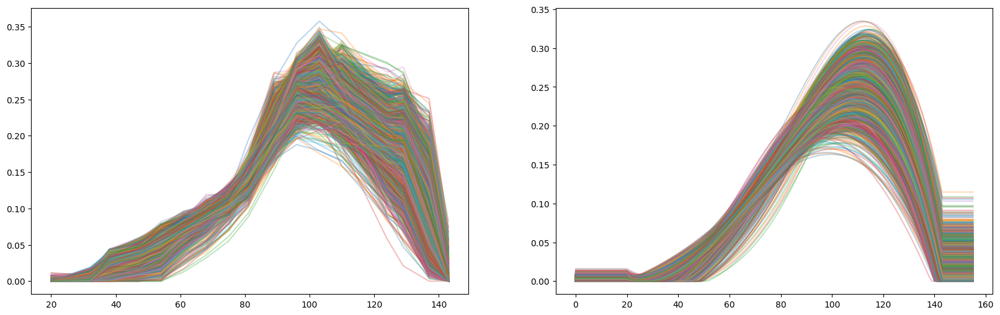

In [160]:
fig, axes = plt.subplots(ncols=2, figsize=(20, 6))

axes[0].plot(indices_2020["grid_exg"], cleaned_data_2020["grid_exg"].values[:,1:].T, alpha=0.3);
axes[1].plot(imputed_data_2020["grid_exg"].T, alpha=0.3);


##### canopy height 2020

In [161]:
for i in range(2, 30):
    imputed_data_2020["grid_ch"] = spline_ridge(
        indices_2020["grid_ch"],
        cleaned_data_2020["grid_ch"],
        growth_season_days_2020,
        n_knots=i,
    )
    imputed_data_2020["grid_ch"][imputed_data_2020["grid_ch"] < 0] = 0
    
    mse = mean_squared_error(
        cleaned_data_2020["grid_ch"].values[:, 1:],
        imputed_data_2020["grid_ch"][:, indices_2020["grid_ch"]],
    )
    print(f"num knots: {i:2d},  rmse: {np.sqrt(mse):.2f}")

num knots:  2,  rmse: 0.05
num knots:  3,  rmse: 0.04
num knots:  4,  rmse: 0.02
num knots:  5,  rmse: 0.02
num knots:  6,  rmse: 0.02
num knots:  7,  rmse: 0.02
num knots:  8,  rmse: 0.02
num knots:  9,  rmse: 0.01
num knots: 10,  rmse: 0.02
num knots: 11,  rmse: 0.01
num knots: 12,  rmse: 0.01
num knots: 13,  rmse: 0.01
num knots: 14,  rmse: 0.00
num knots: 15,  rmse: 0.00
num knots: 16,  rmse: 0.00
num knots: 17,  rmse: 0.00
num knots: 18,  rmse: 0.00
num knots: 19,  rmse: 0.00
num knots: 20,  rmse: 0.00
num knots: 21,  rmse: 0.00
num knots: 22,  rmse: 0.00
num knots: 23,  rmse: 0.00
num knots: 24,  rmse: 0.00
num knots: 25,  rmse: 0.00
num knots: 26,  rmse: 0.00
num knots: 27,  rmse: 0.00
num knots: 28,  rmse: 0.00
num knots: 29,  rmse: 0.00


In [162]:
imputed_data_2020["grid_ch"] = spline_ridge(
    indices_2020["grid_ch"],
    cleaned_data_2020["grid_ch"],
    growth_season_days_2020,
    n_knots=4,
)

imputed_data_2020["grid_ch"][imputed_data_2020["grid_ch"] < 0] = 0

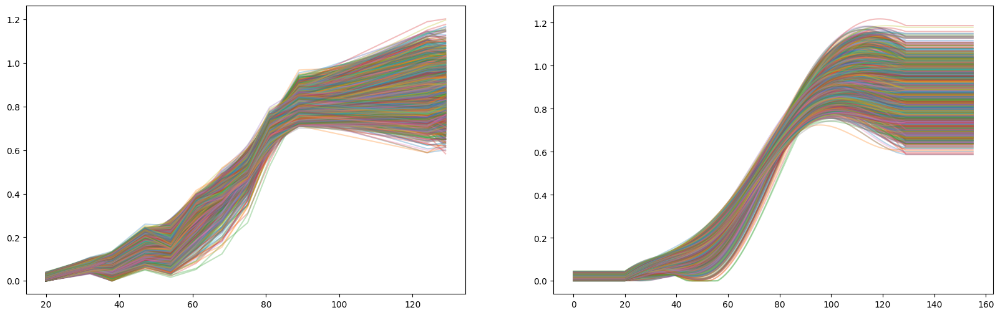

In [163]:
fig, axes = plt.subplots(ncols=2, figsize=(20, 6))

axes[0].plot(indices_2020["grid_ch"], cleaned_data_2020["grid_ch"].values[:,1:].T, alpha=0.3);
axes[1].plot(imputed_data_2020["grid_ch"].T, alpha=0.3);


##### canopy volume 2020

In [164]:
for i in range(2, 30):
    imputed_data_2020["grid_cv"] = spline_ridge(
        indices_2020["grid_cv"],
        cleaned_data_2020["grid_cv"],
        growth_season_days_2020,
        n_knots=i,
    )
    imputed_data_2020["grid_cv"][imputed_data_2020["grid_cv"] < 0] = 0
    
    mse = mean_squared_error(
        cleaned_data_2020["grid_cv"].values[:, 1:],
        imputed_data_2020["grid_cv"][:, indices_2020["grid_cv"]],
    )
    print(f"num knots: {i:2d},  rmse: {np.sqrt(mse):.2f}")

num knots:  2,  rmse: 7.67
num knots:  3,  rmse: 4.26
num knots:  4,  rmse: 3.08
num knots:  5,  rmse: 1.42
num knots:  6,  rmse: 1.77
num knots:  7,  rmse: 0.99
num knots:  8,  rmse: 0.90
num knots:  9,  rmse: 0.63
num knots: 10,  rmse: 0.74
num knots: 11,  rmse: 0.10
num knots: 12,  rmse: 0.38
num knots: 13,  rmse: 0.05
num knots: 14,  rmse: 0.09
num knots: 15,  rmse: 0.05
num knots: 16,  rmse: 0.06
num knots: 17,  rmse: 0.05
num knots: 18,  rmse: 0.05
num knots: 19,  rmse: 0.05
num knots: 20,  rmse: 0.06
num knots: 21,  rmse: 0.06
num knots: 22,  rmse: 0.06
num knots: 23,  rmse: 0.06
num knots: 24,  rmse: 0.06
num knots: 25,  rmse: 0.06
num knots: 26,  rmse: 0.06
num knots: 27,  rmse: 0.06
num knots: 28,  rmse: 0.06
num knots: 29,  rmse: 0.06


In [165]:
imputed_data_2020["grid_cv"] = spline_ridge(
    indices_2020["grid_cv"],
    cleaned_data_2020["grid_cv"],
    growth_season_days_2020,
    n_knots=7,
)

imputed_data_2020["grid_cv"][imputed_data_2020["grid_cv"] < 0] = 0

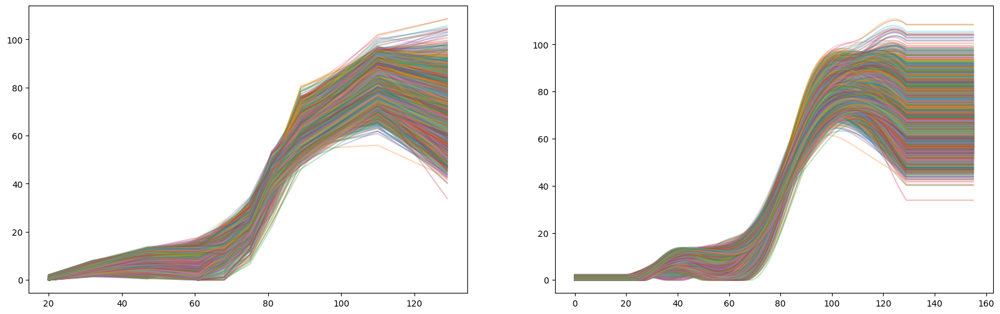

In [166]:
fig, axes = plt.subplots(ncols=2, figsize=(20, 6))

axes[0].plot(indices_2020["grid_cv"], cleaned_data_2020["grid_cv"].values[:,1:].T, alpha=0.3);
axes[1].plot(imputed_data_2020["grid_cv"].T, alpha=0.3);


#### 2021

In [167]:
imputed_data_2021 = dict.fromkeys(FEATURES)

##### canopy cover 2021

In [168]:
for i in range(2, 30):
    imputed_data_2021["grid_cc"] = spline_ridge(
        indices_2021["grid_cc"],
        cleaned_data_2021["grid_cc"],
        growth_season_days_2021,
        n_knots=i,
    )
    imputed_data_2021["grid_cc"][imputed_data_2021["grid_cc"] < 0] = 0
    imputed_data_2021["grid_cc"][imputed_data_2021["grid_cc"] > 0] = 100
    
    mse = mean_squared_error(
        cleaned_data_2021["grid_cc"].values[:, 1:],
        imputed_data_2021["grid_cc"][:, indices_2021["grid_cc"]],
    )
    print(f"num knots: {i:2d},  rmse: {np.sqrt(mse):.2f}")

num knots:  2,  rmse: 46.83
num knots:  3,  rmse: 53.60
num knots:  4,  rmse: 53.82
num knots:  5,  rmse: 54.79
num knots:  6,  rmse: 55.08
num knots:  7,  rmse: 55.08
num knots:  8,  rmse: 55.03
num knots:  9,  rmse: 55.10
num knots: 10,  rmse: 55.07
num knots: 11,  rmse: 55.17
num knots: 12,  rmse: 55.17
num knots: 13,  rmse: 55.17
num knots: 14,  rmse: 55.17
num knots: 15,  rmse: 55.17
num knots: 16,  rmse: 55.17
num knots: 17,  rmse: 55.17
num knots: 18,  rmse: 55.17
num knots: 19,  rmse: 55.17
num knots: 20,  rmse: 55.17
num knots: 21,  rmse: 55.17
num knots: 22,  rmse: 55.17
num knots: 23,  rmse: 55.17
num knots: 24,  rmse: 55.17
num knots: 25,  rmse: 55.17
num knots: 26,  rmse: 55.17
num knots: 27,  rmse: 55.17
num knots: 28,  rmse: 55.17
num knots: 29,  rmse: 55.17


In [169]:
imputed_data_2021["grid_cc"] = spline_ridge(
    indices_2021["grid_cc"],
    cleaned_data_2021["grid_cc"],
    growth_season_days_2021,
    n_knots=4,
)

imputed_data_2021["grid_cc"][imputed_data_2021["grid_cc"] < 0] = 0
imputed_data_2021["grid_cc"][imputed_data_2021["grid_cc"] > 100] = 100

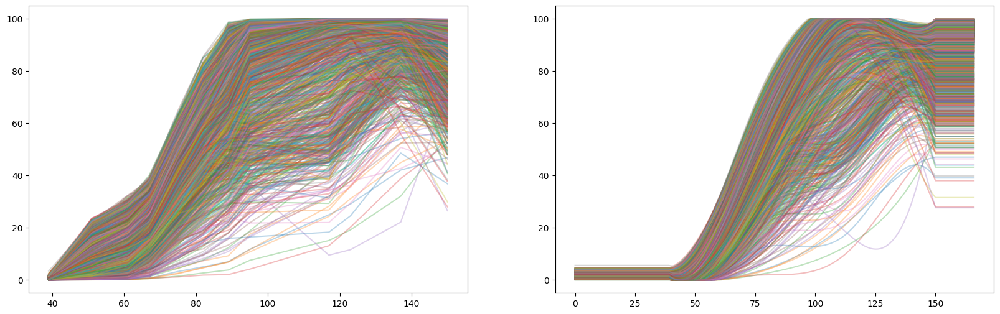

In [170]:
fig, axes = plt.subplots(ncols=2, figsize=(20, 6))

axes[0].plot(indices_2021["grid_cc"], cleaned_data_2021["grid_cc"].values[:,1:].T, alpha=0.3);
axes[1].plot(imputed_data_2021["grid_cc"].T, alpha=0.3);

##### excess greeness index 2021

In [171]:
for i in range(2, 30):
    imputed_data_2021["grid_exg"] = spline_ridge(
        indices_2021["grid_exg"],
        cleaned_data_2021["grid_exg"],
        growth_season_days_2021,
        n_knots=i,
    )
    imputed_data_2021["grid_exg"][imputed_data_2021["grid_exg"] < 0] = 0
    imputed_data_2021["grid_exg"][imputed_data_2021["grid_exg"] > 0] = 100
    
    mse = mean_squared_error(
        cleaned_data_2021["grid_exg"].values[:, 1:],
        imputed_data_2021["grid_exg"][:, indices_2021["grid_exg"]],
    )
    print(f"num knots: {i:2d},  rmse: {np.sqrt(mse):.2f}")

num knots:  2,  rmse: 94.91
num knots:  3,  rmse: 95.64
num knots:  4,  rmse: 98.07
num knots:  5,  rmse: 98.74
num knots:  6,  rmse: 98.20
num knots:  7,  rmse: 98.37
num knots:  8,  rmse: 98.42
num knots:  9,  rmse: 98.92
num knots: 10,  rmse: 98.85
num knots: 11,  rmse: 99.60
num knots: 12,  rmse: 99.60
num knots: 13,  rmse: 98.62
num knots: 14,  rmse: 99.83
num knots: 15,  rmse: 99.83
num knots: 16,  rmse: 99.83
num knots: 17,  rmse: 99.83
num knots: 18,  rmse: 99.83
num knots: 19,  rmse: 99.83
num knots: 20,  rmse: 99.83
num knots: 21,  rmse: 99.83
num knots: 22,  rmse: 99.83
num knots: 23,  rmse: 99.83
num knots: 24,  rmse: 99.83
num knots: 25,  rmse: 99.83
num knots: 26,  rmse: 99.83
num knots: 27,  rmse: 99.83
num knots: 28,  rmse: 99.83
num knots: 29,  rmse: 99.83


In [172]:
imputed_data_2021["grid_exg"] = spline_ridge(
    indices_2021["grid_exg"],
    cleaned_data_2021["grid_exg"],
    growth_season_days_2021,
    n_knots=2,
)

imputed_data_2021["grid_exg"][imputed_data_2021["grid_exg"] < 0] = 0

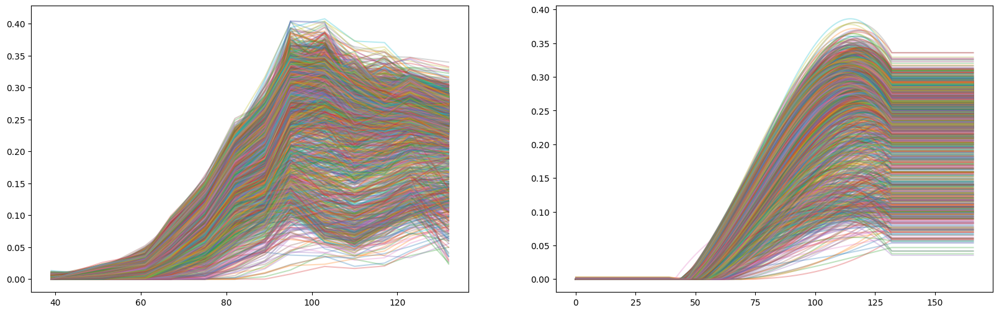

In [173]:
fig, axes = plt.subplots(ncols=2, figsize=(20, 6))

axes[0].plot(indices_2021["grid_exg"], cleaned_data_2021["grid_exg"].values[:,1:].T, alpha=0.3);
axes[1].plot(imputed_data_2021["grid_exg"].T, alpha=0.3);

##### canopy height 2021

In [174]:
for i in range(2, 30):
    imputed_data_2021["grid_ch"] = spline_ridge(
        indices_2021["grid_ch"],
        cleaned_data_2021["grid_ch"],
        growth_season_days_2021,
        n_knots=i,
    )
    imputed_data_2021["grid_ch"][imputed_data_2021["grid_ch"] < 0] = 0
    imputed_data_2021["grid_ch"][imputed_data_2021["grid_ch"] > 0] = 100
    
    mse = mean_squared_error(
        cleaned_data_2021["grid_ch"].values[:, 1:],
        imputed_data_2021["grid_ch"][:, indices_2021["grid_ch"]],
    )
    print(f"num knots: {i:2d},  rmse: {np.sqrt(mse):.2f}")

num knots:  2,  rmse: 93.33
num knots:  3,  rmse: 96.02
num knots:  4,  rmse: 98.51
num knots:  5,  rmse: 99.23
num knots:  6,  rmse: 99.28
num knots:  7,  rmse: 99.33
num knots:  8,  rmse: 99.51
num knots:  9,  rmse: 99.49
num knots: 10,  rmse: 99.51
num knots: 11,  rmse: 99.54
num knots: 12,  rmse: 99.58
num knots: 13,  rmse: 99.58
num knots: 14,  rmse: 99.58
num knots: 15,  rmse: 99.58
num knots: 16,  rmse: 99.58
num knots: 17,  rmse: 99.58
num knots: 18,  rmse: 99.58
num knots: 19,  rmse: 99.58
num knots: 20,  rmse: 99.58
num knots: 21,  rmse: 99.58
num knots: 22,  rmse: 99.58
num knots: 23,  rmse: 99.58
num knots: 24,  rmse: 99.58
num knots: 25,  rmse: 99.58
num knots: 26,  rmse: 99.58
num knots: 27,  rmse: 99.58
num knots: 28,  rmse: 99.58
num knots: 29,  rmse: 99.58


In [175]:
imputed_data_2021["grid_ch"] = spline_ridge(
    indices_2021["grid_ch"],
    cleaned_data_2021["grid_ch"],
    growth_season_days_2021,
    n_knots=2,
)

imputed_data_2021["grid_exg"][imputed_data_2021["grid_exg"] < 0] = 0

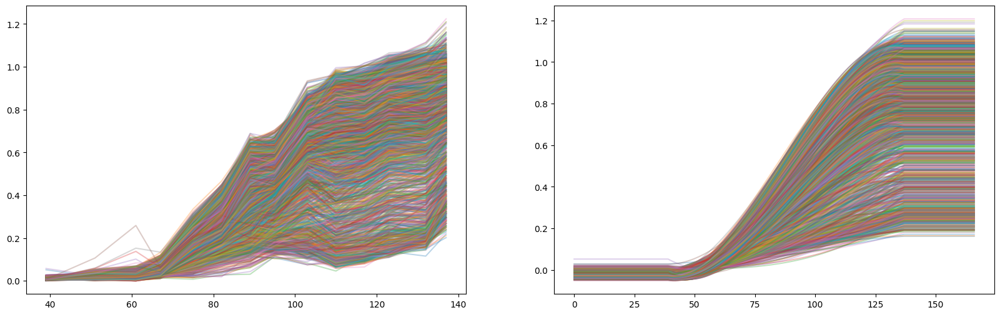

In [176]:
fig, axes = plt.subplots(ncols=2, figsize=(20, 6))

axes[0].plot(indices_2021["grid_ch"], cleaned_data_2021["grid_ch"].values[:,1:].T, alpha=0.3);
axes[1].plot(imputed_data_2021["grid_ch"].T, alpha=0.3);

##### canopy volume 2021

In [177]:
for i in range(2, 30):
    imputed_data_2021["grid_cv"] = spline_ridge(
        indices_2021["grid_cv"],
        cleaned_data_2021["grid_cv"],
        growth_season_days_2021,
        n_knots=i,
    )
    imputed_data_2021["grid_cv"][imputed_data_2021["grid_cv"] < 0] = 0
    imputed_data_2021["grid_cv"][imputed_data_2021["grid_cv"] > 0] = 100
    
    mse = mean_squared_error(
        cleaned_data_2021["grid_cv"].values[:, 1:],
        imputed_data_2021["grid_cv"][:, indices_2021["grid_cv"]],
    )
    print(f"num knots: {i:2d},  rmse: {np.sqrt(mse):.2f}")

num knots:  2,  rmse: 61.39
num knots:  3,  rmse: 66.47
num knots:  4,  rmse: 68.70
num knots:  5,  rmse: 70.06
num knots:  6,  rmse: 70.74
num knots:  7,  rmse: 71.24
num knots:  8,  rmse: 71.75
num knots:  9,  rmse: 72.42
num knots: 10,  rmse: 71.93
num knots: 11,  rmse: 73.57
num knots: 12,  rmse: 73.95
num knots: 13,  rmse: 73.63
num knots: 14,  rmse: 73.95
num knots: 15,  rmse: 73.95
num knots: 16,  rmse: 73.95
num knots: 17,  rmse: 73.95
num knots: 18,  rmse: 73.95
num knots: 19,  rmse: 73.95
num knots: 20,  rmse: 73.95
num knots: 21,  rmse: 73.95
num knots: 22,  rmse: 73.95
num knots: 23,  rmse: 73.95
num knots: 24,  rmse: 73.95
num knots: 25,  rmse: 73.95
num knots: 26,  rmse: 73.95
num knots: 27,  rmse: 73.95
num knots: 28,  rmse: 73.95
num knots: 29,  rmse: 73.95


In [178]:
imputed_data_2021["grid_cv"] = spline_ridge(
    indices_2021["grid_cv"],
    cleaned_data_2021["grid_cv"],
    growth_season_days_2021,
    n_knots=2,
)

imputed_data_2021["grid_cv"][imputed_data_2021["grid_cv"] < 0] = 0

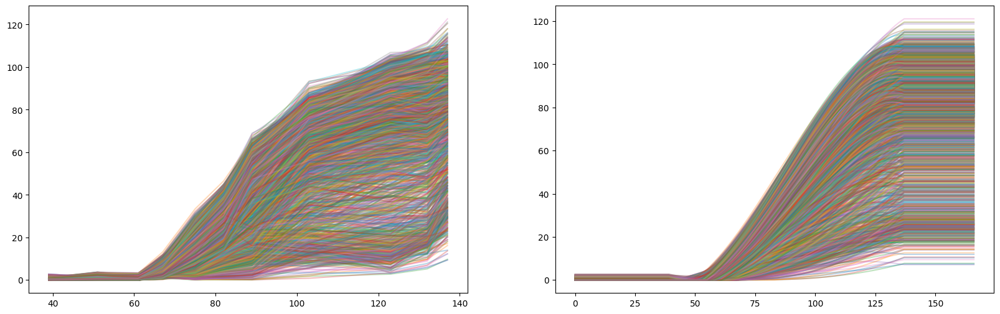

In [179]:
fig, axes = plt.subplots(ncols=2, figsize=(20, 6))

axes[0].plot(indices_2021["grid_cv"], cleaned_data_2021["grid_cv"].values[:,1:].T, alpha=0.3);
axes[1].plot(imputed_data_2021["grid_cv"].T, alpha=0.3);

#### 2022

In [180]:
imputed_data_2022 = dict.fromkeys(FEATURES)

##### canopy cover 2022

In [181]:
for i in range(2, 30):
    imputed_data_2022["grid_cc"] = spline_ridge(
        indices_2022["grid_cc"],
        cleaned_data_2022["grid_cc"],
        growth_season_days_2022,
        n_knots=i,
    )
    imputed_data_2022["grid_cc"][imputed_data_2022["grid_cc"] < 0] = 0
    imputed_data_2022["grid_cc"][imputed_data_2022["grid_cc"] > 0] = 100
    
    mse = mean_squared_error(
        cleaned_data_2022["grid_cc"].values[:, 1:],
        imputed_data_2022["grid_cc"][:, indices_2022["grid_cc"]],
    )
    print(f"num knots: {i:2d},  rmse: {np.sqrt(mse):.2f}")

num knots:  2,  rmse: 66.56
num knots:  3,  rmse: 70.03
num knots:  4,  rmse: 72.26
num knots:  5,  rmse: 70.64
num knots:  6,  rmse: 70.90
num knots:  7,  rmse: 71.03
num knots:  8,  rmse: 74.08
num knots:  9,  rmse: 76.17
num knots: 10,  rmse: 76.65
num knots: 11,  rmse: 76.21
num knots: 12,  rmse: 76.65
num knots: 13,  rmse: 76.62
num knots: 14,  rmse: 76.67
num knots: 15,  rmse: 76.67
num knots: 16,  rmse: 76.67
num knots: 17,  rmse: 76.67
num knots: 18,  rmse: 76.67
num knots: 19,  rmse: 76.67
num knots: 20,  rmse: 76.67
num knots: 21,  rmse: 76.67
num knots: 22,  rmse: 76.67
num knots: 23,  rmse: 76.67
num knots: 24,  rmse: 76.67
num knots: 25,  rmse: 76.67
num knots: 26,  rmse: 76.67
num knots: 27,  rmse: 76.67
num knots: 28,  rmse: 76.67
num knots: 29,  rmse: 76.67


In [182]:
imputed_data_2022["grid_cc"] = spline_ridge(
    indices_2022["grid_cc"],
    cleaned_data_2022["grid_cc"],
    growth_season_days_2022,
    n_knots=6,
)

imputed_data_2022["grid_cc"][imputed_data_2022["grid_cc"] < 0] = 0

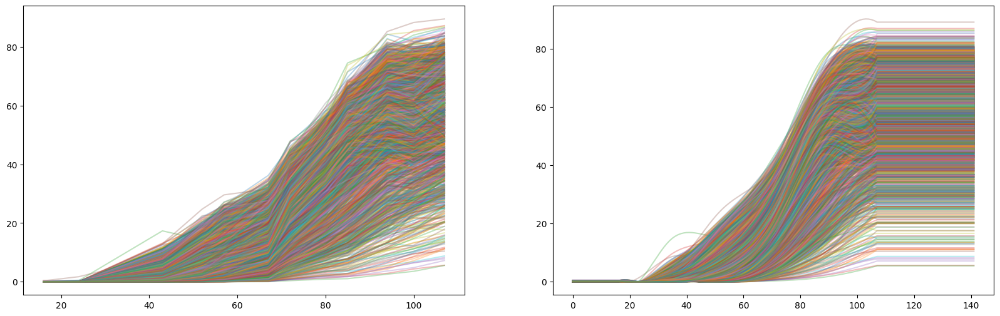

In [183]:
fig, axes = plt.subplots(ncols=2, figsize=(20, 6))

axes[0].plot(indices_2022["grid_cc"], cleaned_data_2022["grid_cc"].values[:,1:].T, alpha=0.3);
axes[1].plot(imputed_data_2022["grid_cc"].T, alpha=0.3);

##### excess greenness index 2022

In [184]:
for i in range(2, 30):
    imputed_data_2022["grid_exg"] = spline_ridge(
        indices_2022["grid_exg"],
        cleaned_data_2022["grid_exg"],
        growth_season_days_2022,
        n_knots=i,
    )
    imputed_data_2022["grid_exg"][imputed_data_2022["grid_exg"] < 0] = 0
    imputed_data_2022["grid_exg"][imputed_data_2022["grid_exg"] > 0] = 100
    
    mse = mean_squared_error(
        cleaned_data_2022["grid_exg"].values[:, 1:],
        imputed_data_2022["grid_exg"][:, indices_2022["grid_exg"]],
    )
    print(f"num knots: {i:2d},  rmse: {np.sqrt(mse):.2f}")

num knots:  2,  rmse: 91.29
num knots:  3,  rmse: 91.92
num knots:  4,  rmse: 90.90
num knots:  5,  rmse: 92.43
num knots:  6,  rmse: 92.76
num knots:  7,  rmse: 93.82
num knots:  8,  rmse: 94.85
num knots:  9,  rmse: 94.37
num knots: 10,  rmse: 94.62
num knots: 11,  rmse: 96.30
num knots: 12,  rmse: 98.23
num knots: 13,  rmse: 97.04
num knots: 14,  rmse: 98.39
num knots: 15,  rmse: 99.51
num knots: 16,  rmse: 98.67
num knots: 17,  rmse: 99.94
num knots: 18,  rmse: 99.87
num knots: 19,  rmse: 99.94
num knots: 20,  rmse: 99.94
num knots: 21,  rmse: 99.95
num knots: 22,  rmse: 99.95
num knots: 23,  rmse: 99.95
num knots: 24,  rmse: 99.95
num knots: 25,  rmse: 99.95
num knots: 26,  rmse: 99.95
num knots: 27,  rmse: 99.95
num knots: 28,  rmse: 99.95
num knots: 29,  rmse: 99.95


In [185]:
imputed_data_2022["grid_exg"] = spline_ridge(
    indices_2022["grid_exg"],
    cleaned_data_2022["grid_exg"],
    growth_season_days_2022,
    n_knots=2,
)

imputed_data_2022["grid_exg"][imputed_data_2022["grid_exg"] < 0] = 0

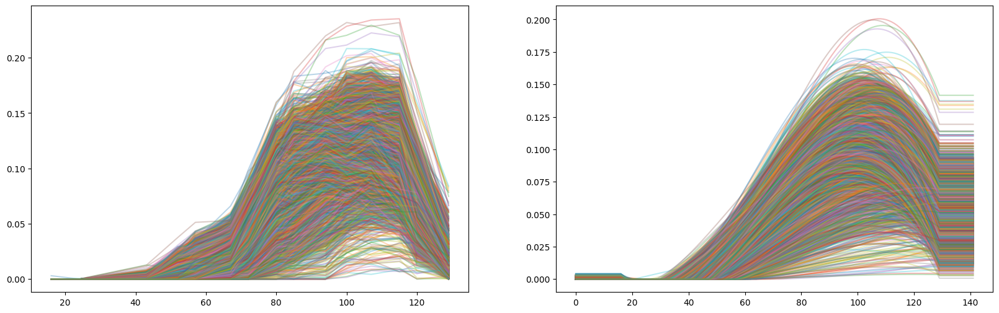

In [186]:
fig, axes = plt.subplots(ncols=2, figsize=(20, 6))

axes[0].plot(indices_2022["grid_exg"], cleaned_data_2022["grid_exg"].values[:,1:].T, alpha=0.3);
axes[1].plot(imputed_data_2022["grid_exg"].T, alpha=0.3);

##### canopy height 2022

In [187]:
for i in range(2, 30):
    imputed_data_2022["grid_ch"] = spline_ridge(
        indices_2022["grid_ch"],
        cleaned_data_2022["grid_ch"],
        growth_season_days_2022,
        n_knots=i,
    )
    imputed_data_2022["grid_ch"][imputed_data_2022["grid_ch"] < 0] = 0
    imputed_data_2022["grid_ch"][imputed_data_2022["grid_ch"] > 0] = 100
    
    mse = mean_squared_error(
        cleaned_data_2022["grid_ch"].values[:, 1:],
        imputed_data_2022["grid_ch"][:, indices_2022["grid_ch"]],
    )
    print(f"num knots: {i:2d},  rmse: {np.sqrt(mse):.2f}")

num knots:  2,  rmse: 94.21
num knots:  3,  rmse: 97.44
num knots:  4,  rmse: 99.80
num knots:  5,  rmse: 99.81
num knots:  6,  rmse: 99.85
num knots:  7,  rmse: 99.57
num knots:  8,  rmse: 99.19
num knots:  9,  rmse: 99.90
num knots: 10,  rmse: 99.90
num knots: 11,  rmse: 99.90
num knots: 12,  rmse: 99.90
num knots: 13,  rmse: 99.90
num knots: 14,  rmse: 99.90
num knots: 15,  rmse: 99.90
num knots: 16,  rmse: 99.90
num knots: 17,  rmse: 99.90
num knots: 18,  rmse: 99.90
num knots: 19,  rmse: 99.90
num knots: 20,  rmse: 99.90
num knots: 21,  rmse: 99.90
num knots: 22,  rmse: 99.90
num knots: 23,  rmse: 99.90
num knots: 24,  rmse: 99.90
num knots: 25,  rmse: 99.90
num knots: 26,  rmse: 99.90
num knots: 27,  rmse: 99.90
num knots: 28,  rmse: 99.90
num knots: 29,  rmse: 99.90


In [188]:
imputed_data_2022["grid_ch"] = spline_ridge(
    indices_2022["grid_ch"],
    cleaned_data_2022["grid_ch"],
    growth_season_days_2022,
    n_knots=2,
)

imputed_data_2022["grid_ch"][imputed_data_2022["grid_ch"] < 0] = 0

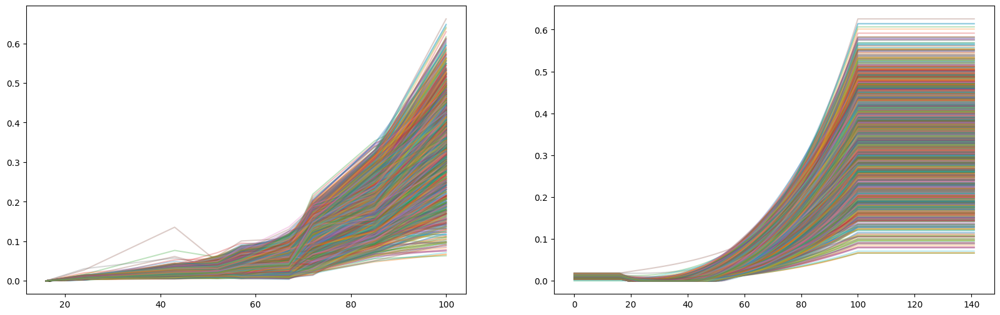

In [189]:
fig, axes = plt.subplots(ncols=2, figsize=(20, 6))

axes[0].plot(indices_2022["grid_ch"], cleaned_data_2022["grid_ch"].values[:,1:].T, alpha=0.3);
axes[1].plot(imputed_data_2022["grid_ch"].T, alpha=0.3);

##### canopy volume 2022

In [190]:
for i in range(2, 30):
    imputed_data_2022["grid_cv"] = spline_ridge(
        indices_2022["grid_cv"],
        cleaned_data_2022["grid_cv"],
        growth_season_days_2022,
        n_knots=i,
    )
    imputed_data_2022["grid_cv"][imputed_data_2022["grid_cv"] < 0] = 0
    imputed_data_2022["grid_cv"][imputed_data_2022["grid_cv"] > 0] = 100
    
    mse = mean_squared_error(
        cleaned_data_2022["grid_cv"].values[:, 1:],
        imputed_data_2022["grid_cv"][:, indices_2022["grid_cv"]],
    )
    print(f"num knots: {i:2d},  rmse: {np.sqrt(mse):.2f}")

num knots:  2,  rmse: 77.15
num knots:  3,  rmse: 73.48
num knots:  4,  rmse: 81.91
num knots:  5,  rmse: 83.17
num knots:  6,  rmse: 85.64
num knots:  7,  rmse: 82.69
num knots:  8,  rmse: 86.78
num knots:  9,  rmse: 84.54
num knots: 10,  rmse: 89.10
num knots: 11,  rmse: 86.17
num knots: 12,  rmse: 89.48
num knots: 13,  rmse: 89.36
num knots: 14,  rmse: 89.50
num knots: 15,  rmse: 89.50
num knots: 16,  rmse: 89.50
num knots: 17,  rmse: 89.50
num knots: 18,  rmse: 89.50
num knots: 19,  rmse: 89.50
num knots: 20,  rmse: 89.50
num knots: 21,  rmse: 89.50
num knots: 22,  rmse: 89.50
num knots: 23,  rmse: 89.50
num knots: 24,  rmse: 89.50
num knots: 25,  rmse: 89.50
num knots: 26,  rmse: 89.50
num knots: 27,  rmse: 89.50
num knots: 28,  rmse: 89.50
num knots: 29,  rmse: 89.50


In [191]:
imputed_data_2022["grid_cv"] = spline_ridge(
    indices_2022["grid_cv"],
    cleaned_data_2022["grid_cv"],
    growth_season_days_2022,
    n_knots=3,
)

imputed_data_2022["grid_cv"][imputed_data_2022["grid_cv"] < 0] = 0

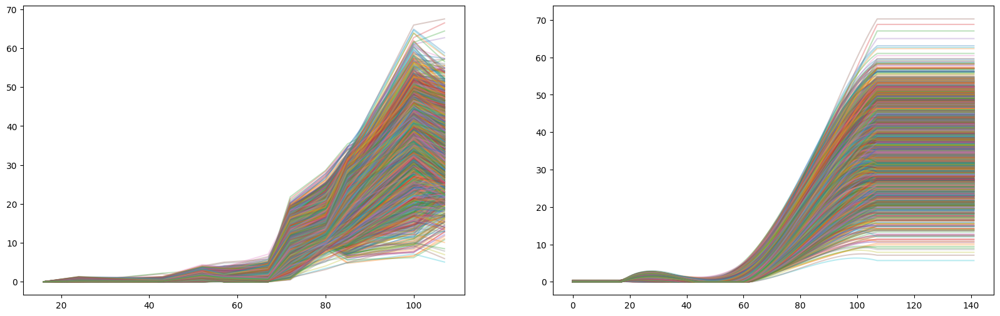

In [192]:
fig, axes = plt.subplots(ncols=2, figsize=(20, 6))

axes[0].plot(indices_2022["grid_cv"], cleaned_data_2022["grid_cv"].values[:,1:].T, alpha=0.3);
axes[1].plot(imputed_data_2022["grid_cv"].T, alpha=0.3);

### generate train data

In [193]:
display_shape_information(imputed_data_2020, yield_data_2020)

grid_cc, shape: (3523, 156) grid_exg, shape: (3523, 156) grid_ch, shape: (3523, 156) grid_cv, shape: (3523, 156) yield data shape: (3523, 2)


In [194]:
display_shape_information(imputed_data_2021, yield_data_2021)

grid_cc, shape: (3718, 167) grid_exg, shape: (3718, 167) grid_ch, shape: (3718, 167) grid_cv, shape: (3718, 167) yield data shape: (3718, 2)


In [195]:
display_shape_information(imputed_data_2022, yield_data_2022)

grid_cc, shape: (3983, 142) grid_exg, shape: (3983, 142) grid_ch, shape: (3983, 142) grid_cv, shape: (3983, 142) yield data shape: (3983, 2)


#### 2020

In [196]:
print(
    np.min(np.argmax(imputed_data_2020["grid_cc"], axis=1)),
    np.max(np.argmax(imputed_data_2020["grid_cc"], axis=1)),
)

97 116


In [197]:
print(
    np.min(np.argmax(imputed_data_2020["grid_exg"], axis=1)),
    np.max(np.argmax(imputed_data_2020["grid_exg"], axis=1)),
)

94 119


In [198]:
print(
    np.min(np.argmax(imputed_data_2020["grid_ch"], axis=1)),
    np.max(np.argmax(imputed_data_2020["grid_ch"], axis=1)),
)

96 129


In [199]:
print(
    np.min(np.argmax(imputed_data_2020["grid_cv"], axis=1)),
    np.max(np.argmax(imputed_data_2020["grid_cv"], axis=1)),
)

99 125


#### 2021

In [200]:
print(
    np.min(np.argmax(imputed_data_2021["grid_cc"], axis=1)),
    np.max(np.argmax(imputed_data_2021["grid_cc"], axis=1)),
)

97 150


In [201]:
print(
    np.min(np.argmax(imputed_data_2021["grid_exg"], axis=1)),
    np.max(np.argmax(imputed_data_2021["grid_exg"], axis=1)),
)

91 132


In [202]:
print(
    np.min(np.argmax(imputed_data_2021["grid_ch"], axis=1)),
    np.max(np.argmax(imputed_data_2021["grid_ch"], axis=1)),
)

119 137


In [203]:
print(
    np.min(np.argmax(imputed_data_2021["grid_cv"], axis=1)),
    np.max(np.argmax(imputed_data_2021["grid_cv"], axis=1)),
)

117 137


#### 2022

In [204]:
print(
    np.min(np.argmax(imputed_data_2022["grid_cc"], axis=1)),
    np.max(np.argmax(imputed_data_2022["grid_cc"], axis=1)),
)

64 107


In [205]:
print(
    np.min(np.argmax(imputed_data_2022["grid_exg"], axis=1)),
    np.max(np.argmax(imputed_data_2022["grid_exg"], axis=1)),
)

92 129


In [206]:
print(
    np.min(np.argmax(imputed_data_2022["grid_ch"], axis=1)),
    np.max(np.argmax(imputed_data_2022["grid_ch"], axis=1)),
)

100 100


In [207]:
print(
    np.min(np.argmax(imputed_data_2022["grid_cv"], axis=1)),
    np.max(np.argmax(imputed_data_2022["grid_cv"], axis=1)),
)

97 107


#### generate data

##### 2020

In [208]:
def generate_data(imputed_data, grow_season_days):
    data = []
    for row in imputed_data:
        max_index = np.argmax(row)
        if max_index - 90 < 0:
            data.append(row[:121].tolist())
        elif  max_index + 31 > grow_season_days:
            tmp = list(row[-1:]) * (max_index + 31 - grow_season_days)
            row = np.concatenate([row, tmp])
            data.append(row[max_index-90: max_index+31].tolist())
        else:
            data.append(row[max_index-90: max_index+31].tolist())
    return data

In [209]:
imputed_120_days_data_2020 = dict.fromkeys(FEATURES)

In [210]:
imputed_120_days_data_2020["grid_cc"] = generate_data(imputed_data_2020["grid_cc"], growth_season_days_2020)
imputed_120_days_data_2020["grid_cc"] = np.array(imputed_120_days_data_2020["grid_cc"])
imputed_120_days_data_2020["grid_exg"] = generate_data(imputed_data_2020["grid_exg"], growth_season_days_2020)
imputed_120_days_data_2020["grid_exg"] = np.array(imputed_120_days_data_2020["grid_exg"])
imputed_120_days_data_2020["grid_ch"] = generate_data(imputed_data_2020["grid_ch"], growth_season_days_2020)
imputed_120_days_data_2020["grid_ch"] = np.array(imputed_120_days_data_2020["grid_ch"])
imputed_120_days_data_2020["grid_cv"] = generate_data(imputed_data_2020["grid_cv"], growth_season_days_2020)
imputed_120_days_data_2020["grid_cv"] = np.array(imputed_120_days_data_2020["grid_cv"])

In [211]:
imputed_120_days_data_2021 = dict.fromkeys(FEATURES)

In [212]:
imputed_120_days_data_2021["grid_cc"] = generate_data(imputed_data_2021["grid_cc"], growth_season_days_2021)
imputed_120_days_data_2021["grid_cc"] = np.array(imputed_120_days_data_2021["grid_cc"])
imputed_120_days_data_2021["grid_exg"] = generate_data(imputed_data_2021["grid_exg"], growth_season_days_2021)
imputed_120_days_data_2021["grid_exg"] = np.array(imputed_120_days_data_2021["grid_exg"])
imputed_120_days_data_2021["grid_ch"] = generate_data(imputed_data_2021["grid_ch"], growth_season_days_2021)
imputed_120_days_data_2021["grid_ch"] = np.array(imputed_120_days_data_2021["grid_ch"])
imputed_120_days_data_2021["grid_cv"] = generate_data(imputed_data_2021["grid_cv"], growth_season_days_2021)
imputed_120_days_data_2021["grid_cv"] = np.array(imputed_120_days_data_2021["grid_cv"])

In [213]:
imputed_120_days_data_2022 = dict.fromkeys(FEATURES)

In [214]:
imputed_120_days_data_2022["grid_cc"] = generate_data(imputed_data_2022["grid_cc"], growth_season_days_2022)
imputed_120_days_data_2022["grid_cc"] = np.array(imputed_120_days_data_2022["grid_cc"])
imputed_120_days_data_2022["grid_exg"] = generate_data(imputed_data_2022["grid_exg"], growth_season_days_2022)
imputed_120_days_data_2022["grid_exg"] = np.array(imputed_120_days_data_2022["grid_exg"])
imputed_120_days_data_2022["grid_ch"] = generate_data(imputed_data_2022["grid_ch"], growth_season_days_2022)
imputed_120_days_data_2022["grid_ch"] = np.array(imputed_120_days_data_2022["grid_ch"])
imputed_120_days_data_2022["grid_cv"] = generate_data(imputed_data_2022["grid_cv"], growth_season_days_2022)
imputed_120_days_data_2022["grid_cv"] = np.array(imputed_120_days_data_2022["grid_cv"])

In [215]:
display_shape_information(imputed_120_days_data_2020, yield_data_2020)

grid_cc, shape: (3523, 121) grid_exg, shape: (3523, 121) grid_ch, shape: (3523, 121) grid_cv, shape: (3523, 121) yield data shape: (3523, 2)


In [216]:
display_shape_information(imputed_120_days_data_2021, yield_data_2021)

grid_cc, shape: (3718, 121) grid_exg, shape: (3718, 121) grid_ch, shape: (3718, 121) grid_cv, shape: (3718, 121) yield data shape: (3718, 2)


In [217]:
display_shape_information(imputed_120_days_data_2022, yield_data_2022)

grid_cc, shape: (3983, 121) grid_exg, shape: (3983, 121) grid_ch, shape: (3983, 121) grid_cv, shape: (3983, 121) yield data shape: (3983, 2)


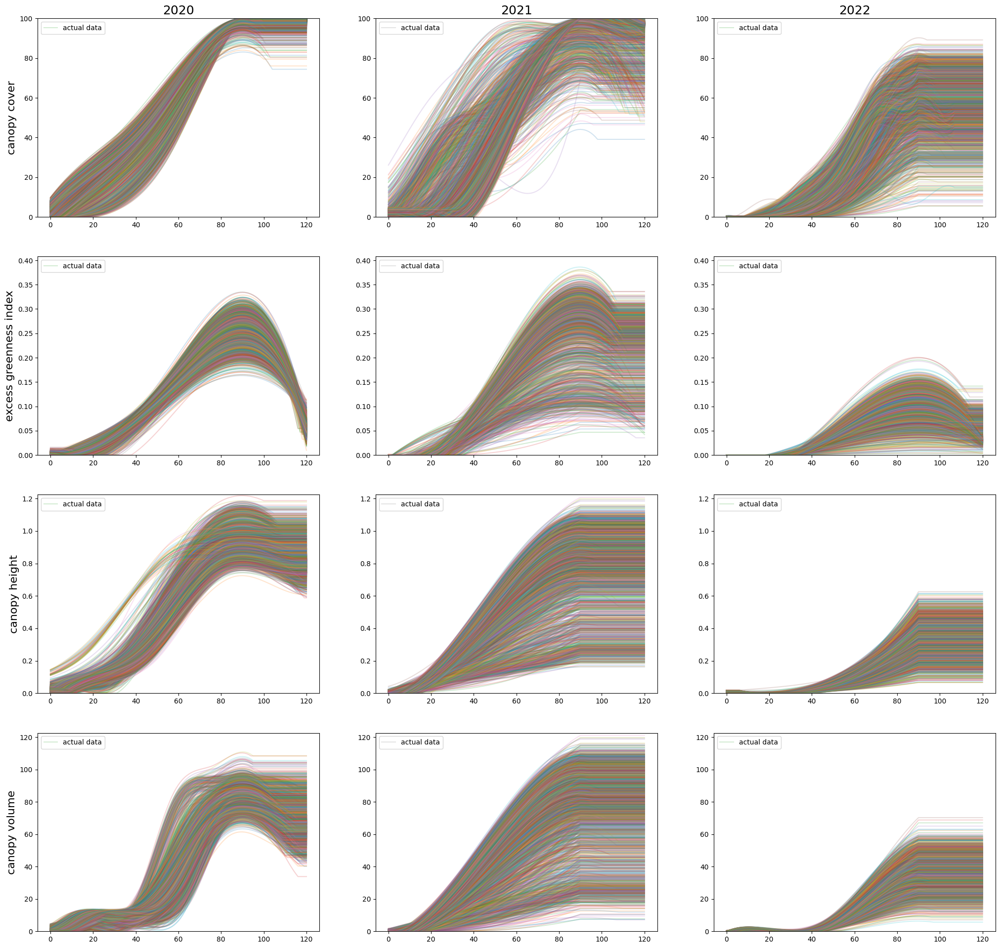

In [218]:
# visualize

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(25, 24))

# generate graph
for i, info in enumerate(graph_info):
    # 2020
    handles_2020 = axes[i][0].plot(imputed_120_days_data_2020[info[0]].T, alpha=0.2)
    axes[i][0].set_ylabel(info[1], fontsize=16)
    axes[i][0].set_ylim(info[2])
    axes[i][0].legend(handles_2020[-1:], ["actual data"], loc="upper left")

    # 2021
    handles_2021 = axes[i][1].plot(imputed_120_days_data_2021[info[0]].T, alpha=0.2)
    axes[i][1].set_ylim(info[2])
    axes[i][1].legend(handles_2021[-1:], ["actual data"], loc="upper left")
        
    # 2022
    handles_2022 = axes[i][2].plot(imputed_120_days_data_2022[info[0]].T, alpha=0.2)
    axes[i][2].set_ylim(info[2])
    axes[i][2].legend(handles_2022[-1:], ["actual data"], loc="upper left")

axes[0][0].set_title("2020", fontsize=18);
axes[0][1].set_title("2021", fontsize=18);
axes[0][2].set_title("2022", fontsize=18);

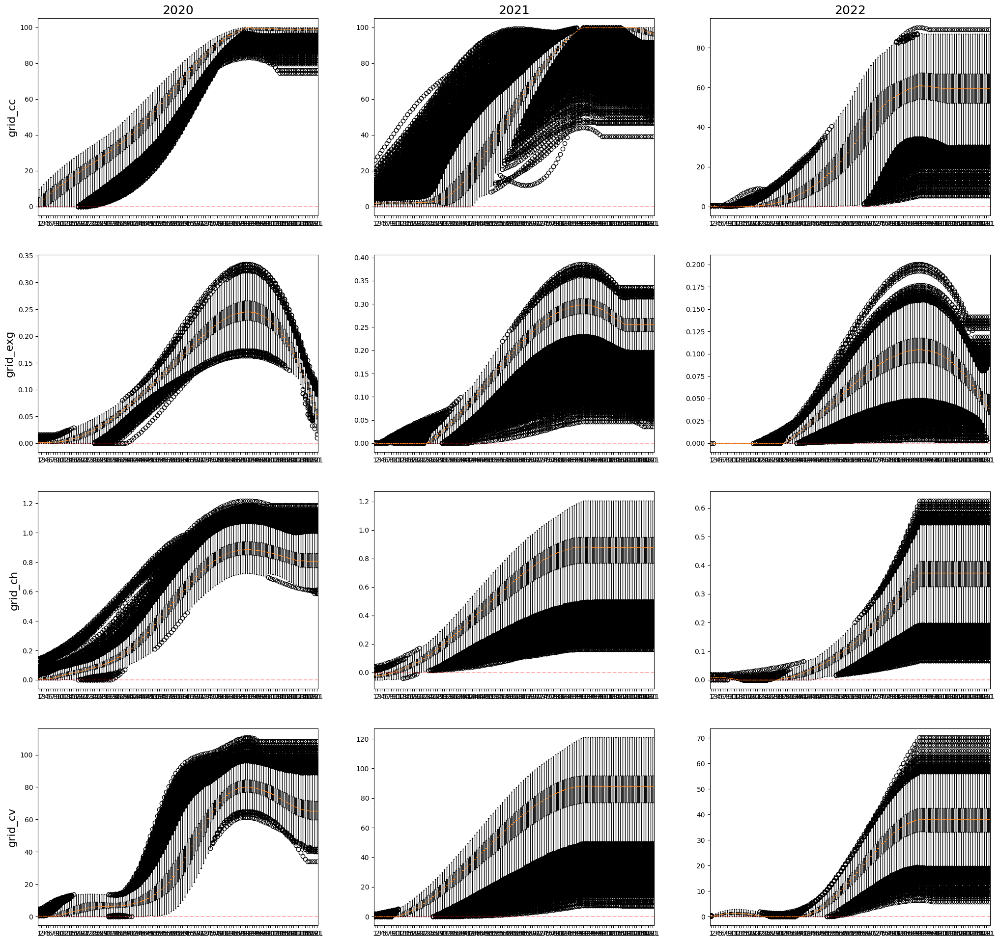

In [219]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(25, 24))

for i, feature in enumerate(FEATURES):
    # 2020
    axes[i][0].boxplot(imputed_120_days_data_2020[feature])
    axes[i][0].axhline(y=0, linestyle='--', color='red', alpha=0.3)
    axes[i][0].set_ylabel(feature, fontsize=16)
    # 2021
    axes[i][1].boxplot(imputed_120_days_data_2021[feature])
    axes[i][1].axhline(y=0, linestyle='--', color='red', alpha=0.3)
    # 2022
    axes[i][2].boxplot(imputed_120_days_data_2022[feature])
    axes[i][2].axhline(y=0, linestyle='--', color='red', alpha=0.3)

axes[0][0].set_title("2020", fontsize=18);
axes[0][1].set_title("2021", fontsize=18);
axes[0][2].set_title("2022", fontsize=18);

### save imputed data

In [220]:
for feature in FEATURES:
    imputed_120_days_data_2020[feature] = pd.DataFrame(imputed_120_days_data_2020[feature])
    file_name = "./imputed-data-version2/2020/" + feature + ".pkl"
    imputed_120_days_data_2020[feature].to_pickle(file_name)
    
yield_2020 = yield_data_2020["yield_kg"]
yield_file_name_2020 = "./imputed-data-version2/2020/yield.pkl"
yield_2020.to_pickle(yield_file_name_2020)

In [221]:
for feature in FEATURES:
    imputed_120_days_data_2021[feature] = pd.DataFrame(imputed_120_days_data_2021[feature])
    file_name = "./imputed-data-version2/2021/" + feature + ".pkl"
    imputed_120_days_data_2021[feature].to_pickle(file_name)

yield_2021 = yield_data_2021["yield_kg"]
yield_file_name_2021 = "./imputed-data-version2/2021/yield.pkl"
yield_2021.to_pickle(yield_file_name_2021)

In [222]:
for feature in FEATURES:
    imputed_120_days_data_2022[feature] = pd.DataFrame(imputed_120_days_data_2022[feature])
    file_name = "./imputed-data-version2/2022/" + feature + ".pkl"
    imputed_120_days_data_2022[feature].to_pickle(file_name)

yield_2022 = yield_data_2022["yield_kg"]
yield_file_name_2022 = "./imputed-data-version2/2022/yield.pkl"
yield_2022.to_pickle(yield_file_name_2022)

In [223]:
yield_data_2020.to_pickle("./imputed-data-version2/2020/yield_2020.pkl")
yield_data_2021.to_pickle("./imputed-data-version2/2021/yield_2021.pkl")
yield_data_2022.to_pickle("./imputed-data-version2/2022/yield_2022.pkl")